# Loading Packages

In [10]:
# Linear Algebra
using LinearAlgebra
# File Handling
using Glob, FITSIO, Serialization, HDF5, DelimitedFiles, LibGit2, Suppressor, JLD2, CSV
# Stats
using StatsBase, Distributions, FreqTables, LsqFit, DataStructures, Optim
using BinnedStatistics, KrylovKit, ImageTransformations
import FastRunningMedian: running_median
# Computing
using DataFrames, ProgressMeter, Distributed, PrettyChairmarks, ImageFiltering
using Random, Interpolations, SparseArrays, EllipsisNotation, ShiftedArrays, ParallelDataTransfer
# Astro
using Healpix, SkyCoords, WCS, AstroTime, DustExtinction
# String Formatting
using LaTeXStrings
# Plotting
using CairoMakie
black_latexfonts = merge(theme_black(), theme_latexfonts()); white_latexfonts = theme_latexfonts()
set_theme!(black_latexfonts); CairoMakie.disable_mime!("svg", "pdf", "text/html");
using ColorSchemes

In [1]:
cd("/uufs/chpc.utah.edu/common/home/u6039752/scratch1/working/2025_10_13/")

# To Do
- download PAHdB structural database [x]
- parse PAHdB structures [x]
- convert to rotational constants [x]
- plot points over posterior for 15272 C2v [x]
- visualize non-planar dimensions [x]
- highlight radio detected PAHs and C60+ [x]
- uid the radio detections, color differently [x]
- convert all units to MHz from inv cm
- get ABC from papers

# Download + Parse PAHdB structural database

In [13]:
include("parse_pahdb.jl")

In [14]:
# Parse the database
filename = "/uufs/chpc.utah.edu/common/home/u6039752/scratch1/working/2025_10_13/pahdb-complete-theoretical-v4.00-alpha_kacca9ms0lgo93HfUcn.ascii"
entries = parse_pahdb(filename);

# Convert to rotational constants

In [15]:
function get_rot_const(x,y,z,massvec)
    com_x, com_y, com_z = mean(x,weights(massvec)), mean(y,weights(massvec)), mean(z,weights(massvec))
    x .-= com_x
    y .-= com_y
    z .-= com_z;
    Ixx = sum(massvec.*(y.^2 .+ z.^2)) # amu A^2
    Ixy = -sum(massvec.*x.*y) # amu A^2
    Ixz = -sum(massvec.*x.*z) # amu A^2

    Iyx = Ixy
    Iyy = sum(massvec.*(x.^2 .+ z.^2)) # amu A^2
    Iyz = -sum(massvec.*y.*z) # amu A^2

    Izx = Ixz
    Izy = Iyz
    Izz = sum(massvec.*(x.^2 .+ y.^2)) # amu A^2

    Imat = [
        Ixx Ixy Ixz;
        Iyx Iyy Iyz;
        Izx Izy Izz]

    elist = eigvals(Symmetric(Imat))
    Bvec = IamuA2_Bcminv.(elist)
    return sort(Bvec,rev=true)
end

IamuA2_Bcminv(I) = 16.857629206/I

function rasym_param(A,B,C)
    return (2*B-A-C)/(A-C)
end

function convert2I(B)
    return 16.857629206/B
end

convert2I (generic function with 1 method)

In [16]:
function rasym_param(A,B,C)
    return (2*B-A-C)/(A-C)
end

rasym_param (generic function with 1 method)

In [17]:
rasym_param(1.001,0.0505,0.05)

-0.9989484752891694

In [18]:
function rot_const_wrapper(entry)
    xyzm = get_xyzm_vectors(entry, rounding=true)
    M = sum(xyzm.mass)
    return get_rot_const(xyzm.x,xyzm.y,xyzm.z,xyzm.mass), M
end

rot_const_wrapper (generic function with 1 method)

In [19]:
pout = @showprogress pmap(rot_const_wrapper, entries);

Progress: 100%|█████████████████████████████████████████| Time: 0:00:05


In [20]:
ABCmat = zeros(3,length(pout))
Mmat = zeros(length(pout))
@showprogress for (indx, subp) in enumerate(pout)
    ABCmat[:,indx] .= subp[1]
    Mmat[indx] = subp[2]
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


In [21]:
kap_vec = map(x->rasym_param(x[1],x[2],x[3]),eachcol(ABCmat));
Ia = convert2I.(ABCmat[1,:])
Ib = convert2I.(ABCmat[2,:])
Ic = convert2I.(ABCmat[3,:])
Iprod = Ia.*Ib.*Ic;
Δ = Ic.-Ib.-Ia;

In [22]:
Astar,Bstar,Cstar = 0.0125, 0.0023, 0.0023
Δstar = convert2I(Cstar)-convert2I(Astar)-convert2I(Bstar)
kap_star = rasym_param(Astar,Bstar,Cstar)
Iprodstar = convert2I(Astar)*convert2I(Bstar)*convert2I(Cstar);

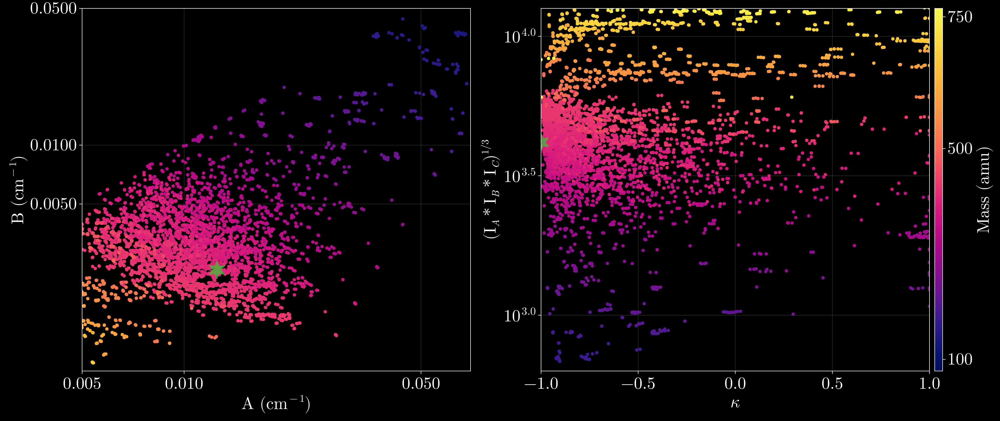

In [208]:
fig = Figure(size=(1900, 800), fontsize=32)
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
)

xlims!(ax,5e-3,7e-2)
ylims!(ax,7e-4,5e-2)

co = scatter!(ax,ABCmat[1,:],ABCmat[2,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256)
scatter!(ax,Astar,Bstar,color=(:limegreen,0.7),marker=:star6, markersize=40)

ax = Axis(fig[1, 2],
    # xscale=Makie.pseudolog10,
    yscale=log10,
    # xticks = [5e-4,5e-3],
    # yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"$\kappa$",
    ylabel=L"(I$_A$*I$_B$*I$_C$)$^{1/3}$",
)

xlims!(ax,-1,1)
ylims!(ax,10^(2.8),10^(4.1))

co = scatter!(ax,kap_vec,Iprod.^(1/3),color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256)
scatter!(ax,kap_star,Iprodstar^(1/3),color=(:limegreen,0.7),marker=:star6, markersize=40)
Colorbar(fig[1, 3], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)
colgap!(fig.layout, 2, 10)

resize_to_layout!(fig)
fig

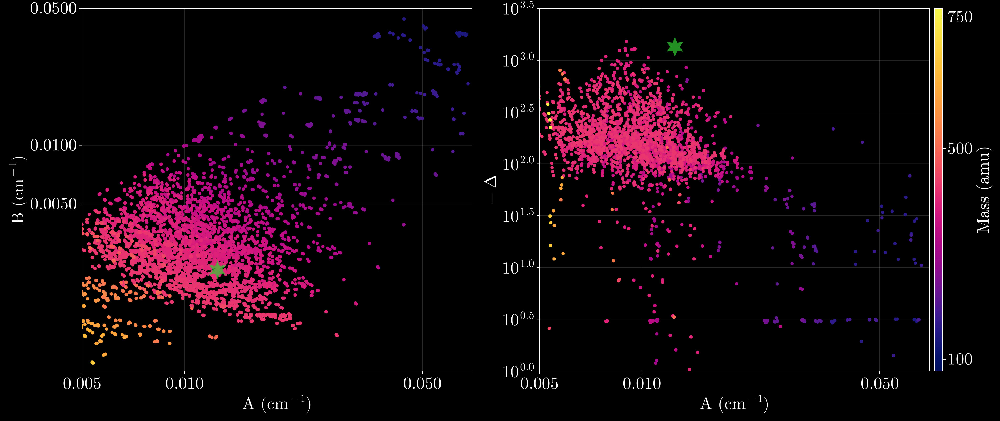

In [71]:
fig = Figure(size=(1900, 800), fontsize=32)
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
)

xlims!(ax,5e-3,7e-2)
ylims!(ax,7e-4,5e-2)

co = scatter!(ax,ABCmat[1,:],ABCmat[2,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256)
scatter!(ax,Astar,Bstar,color=(:limegreen,0.7),marker=:star6, markersize=40)

ax = Axis(fig[1, 2],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    # yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"-Δ",
)

xlims!(ax,5e-3,7e-2)
ylims!(ax,10^(0),10^(3.5))

co = scatter!(ax,ABCmat[1,:],abs.(-Δ),color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256)
scatter!(ax,Astar,-Δstar,color=(:limegreen,0.7),marker=:star6, markersize=40)
Colorbar(fig[1, 3], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)
colgap!(fig.layout, 2, 10)

resize_to_layout!(fig)
fig

# Posterior Plot

In [23]:
f = h5open("../2025_10_04/bc_run_SymmetryC2v_BCTrue_F1p0_DTrue_FlatFalse_SpecTrue_dTTrue_covFalse_nonlinFalse_tauSlope0p05_update.h5")
chain = read(f["mcmc/chain"])
close(f)

In [24]:
burnin = 4000;

T = chain[1,:,burnin:end][:]
C = chain[2,:,burnin:end][:]
B = chain[3,:,burnin:end][:]
A = chain[4,:,burnin:end][:];
aC = chain[5,:,burnin:end][:]
aB = chain[6,:,burnin:end][:]
aA = chain[7,:,burnin:end][:];

In [25]:
kap_vec_post = rasym_param.(A,B,C)
Ia_post = convert2I.(A)
Ib_post = convert2I.(B)
Ic_post = convert2I.(C)
Iprod_post = Ia_post.*Ib_post.*Ic_post;
Δ_post = Ic_post.-Ib_post.-Ia_post;

In [26]:
function get_delta(A,B,C)
    return convert2I(C)-convert2I(A)-convert2I(B)
end

get_iprod(A,B,C) = convert2I(A)*convert2I(B)*convert2I(C)

get_iprod (generic function with 1 method)

In [27]:
df = DataFrame(;T, A, B);

In [75]:
using PairPlots

[ Info: Precompiling PairPlots [43a3c2be-4208-490b-832a-a21dcd55d7da] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling PairPlotsDynamicUnitfulExt [1bd29d90-1c16-57a4-97cf-338f3e0c8f00] (cache misses: wrong dep version loaded (2))


In [74]:
pairplot(df => (
        PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :white])),
        PairPlots.Scatter(filtersigma=3, color=:grey),
        PairPlots.Contour(color=:white),
        PairPlots.MarginHist(color=(:white, 0.2)),
        PairPlots.MarginDensity(bandwidth=0.3, color="white"),
        PairPlots.MarginQuantileText(color="white"),
        PairPlots.MarginQuantileLines(color="grey"),
    ), 
    axis=(;
        B=(;
        ticks=([0.0,0.005,0.010,0.015,0.020]),
        lims=(;low=0,high=0.02),
        ),
    ),
    labels = Dict(
    :T => L"\text{T (K)}",
    :A => L"A (cm$^{-1}$)",
    :B => L"B (cm$^{-1}$)",
))

LoadError: UndefVarError: `PairPlots` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [114]:
median(A)

0.03566257384102169

lets start simpler, and just make a hexbin histogram behind the plot

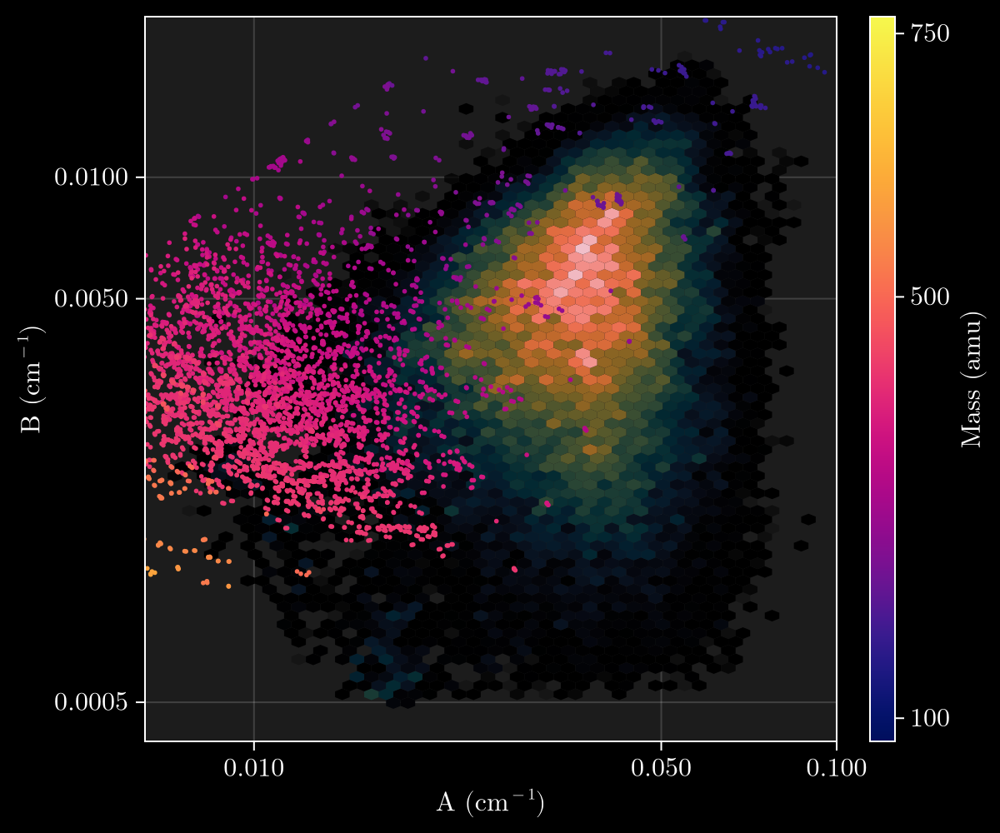

In [155]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,6.5e-3,1e-1)
ylims!(ax,4e-4,2.5e-2)

co = hexbin!(ax,A,B,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,:],ABCmat[2,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

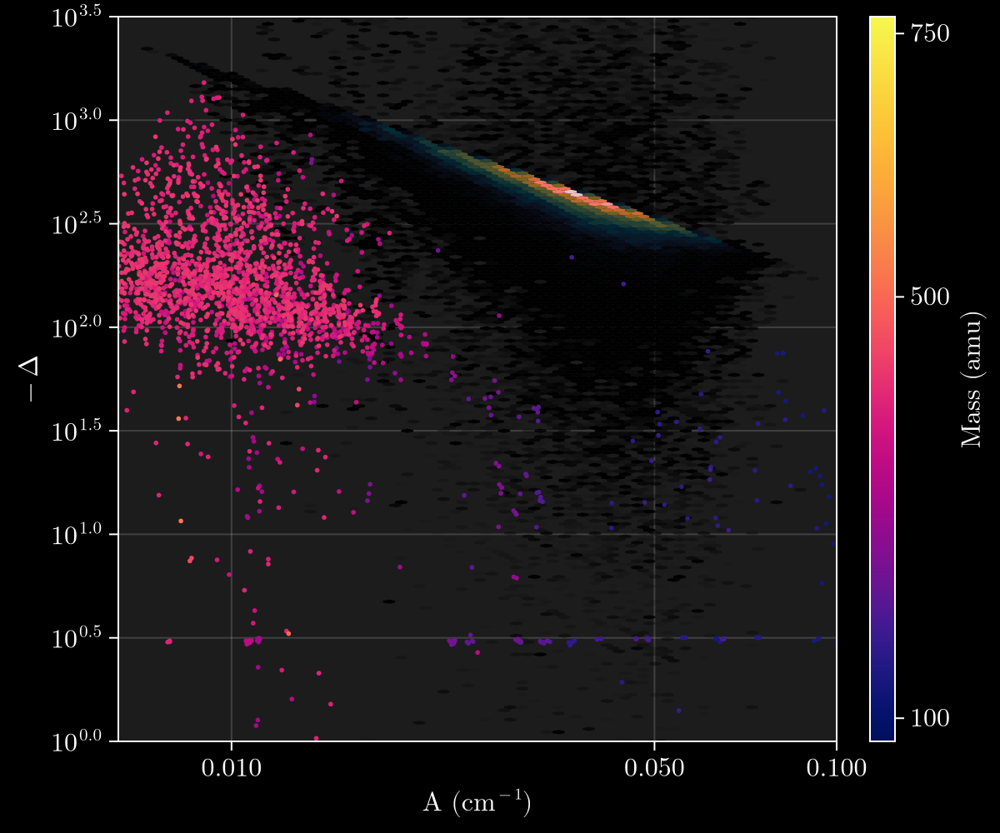

In [161]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))

ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    # yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"-Δ",
    backgroundcolor = :grey11,
)

xlims!(ax,6.5e-3,1e-1)
ylims!(ax,10^(0),10^(3.5))

co = hexbin!(ax,A,abs.(-Δ_post),
    cellsize = (0.02,0.02),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,:],abs.(-Δ),color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

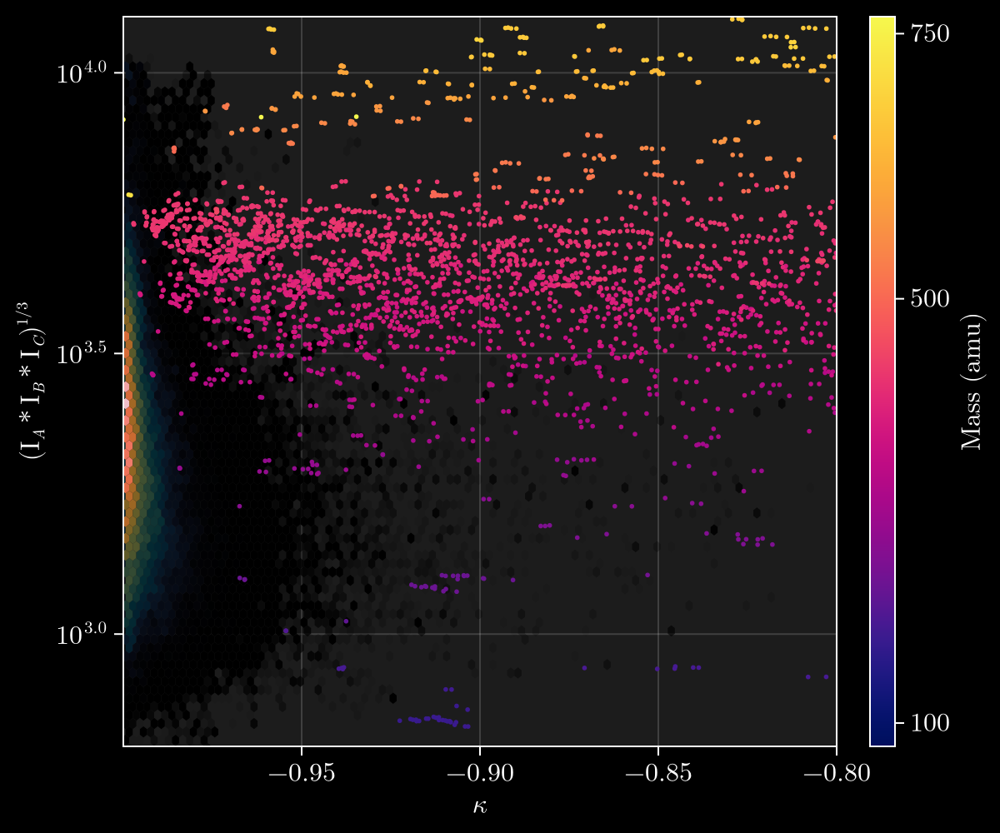

In [153]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
ax = Axis(fig[1, 1],
    # xscale=Makie.pseudolog10,
    yscale=log10,
    # xticks = [5e-4,5e-3],
    # yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"$\kappa$",
    ylabel=L"(I$_A$*I$_B$*I$_C$)$^{1/3}$",
    backgroundcolor = :grey11,
)

xlims!(ax,-1,-0.8)
ylims!(ax,10^(2.8),10^(4.1))

co = hexbin!(ax,kap_vec_post,Iprod_post.^(1/3),
    cellsize = (0.002,0.02),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,kap_vec,Iprod.^(1/3),color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

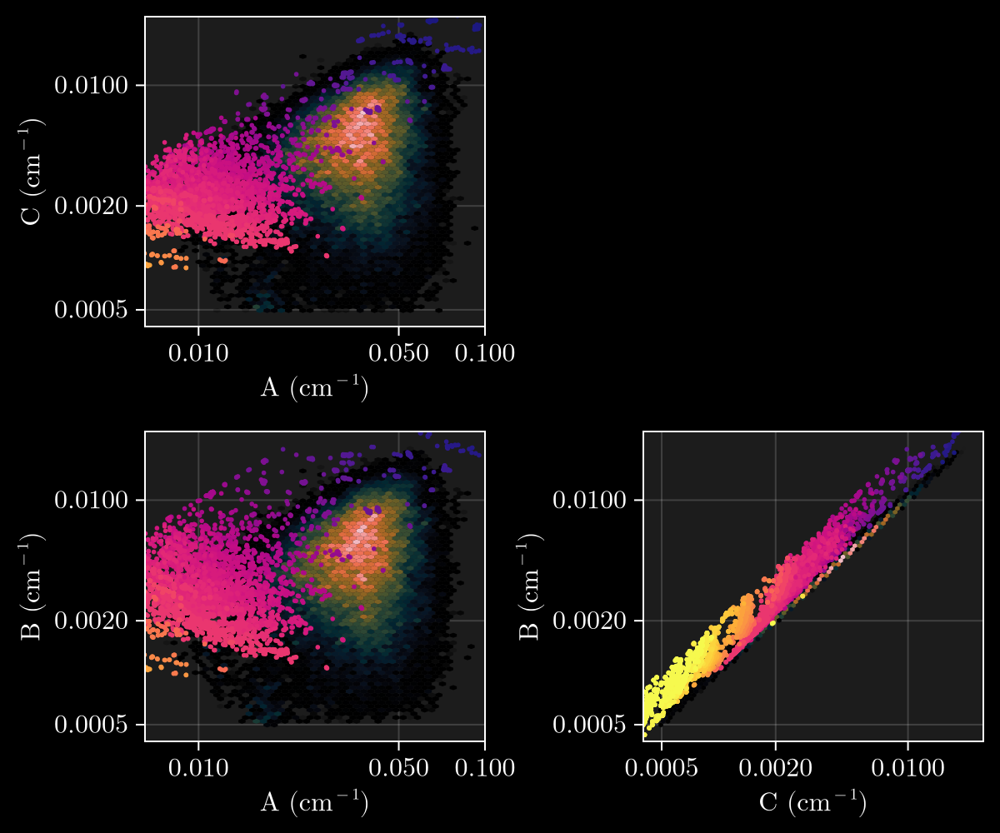

In [165]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[2, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,6.5e-3,1e-1)
ylims!(ax,4e-4,2.5e-2)

co = hexbin!(ax,A,B,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,:],ABCmat[2,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"C (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,6.5e-3,1e-1)
ylims!(ax,4e-4,2.5e-2)

co = hexbin!(ax,A,C,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,:],ABCmat[3,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

ax = Axis(fig[2, 2],
    xscale=log10,
    yscale=log10,
    xticks = [5e-4,1e-4,2e-3,1e-2,5e-2],
    yticks = [5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel=L"C (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,4e-4,2.5e-2)
ylims!(ax,4e-4,2.5e-2)

co = hexbin!(ax,C,B,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[3,:],ABCmat[2,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)


# Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

# colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

can we trust the BC posterior? Seems so degenerate and also somewhat inconsistent with DFT?

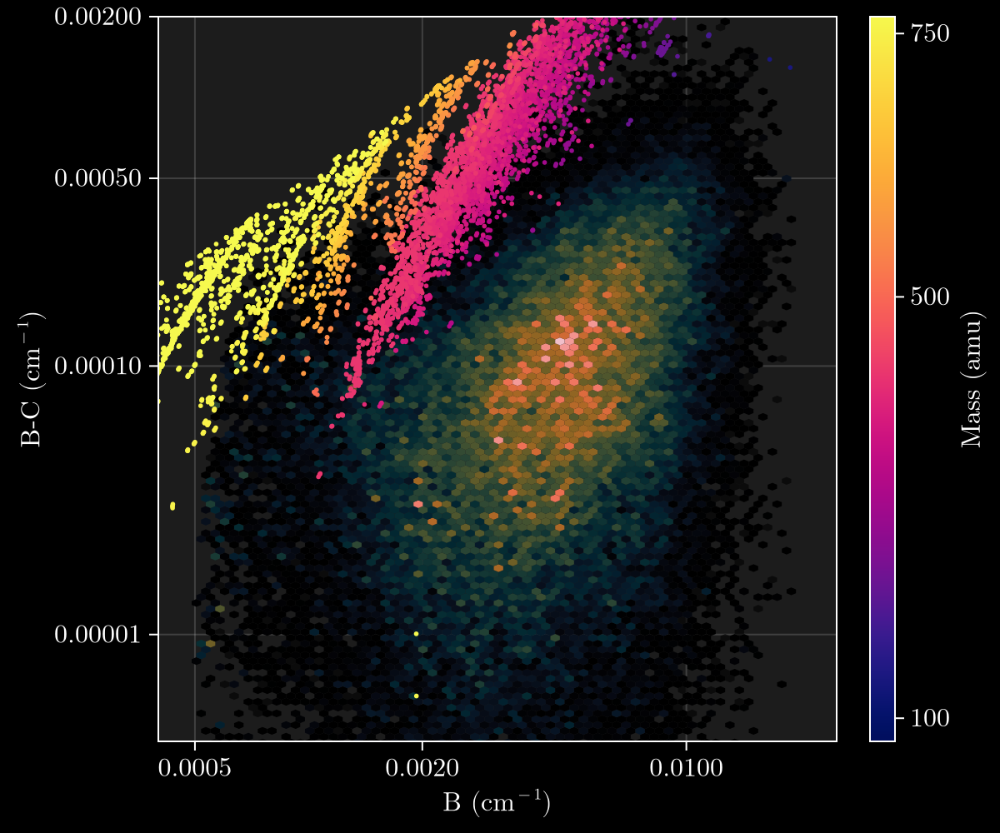

In [172]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-4,1e-4,2e-3,1e-2,5e-2],
    yticks = [1e-5,5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel=L"B (cm$^{-1}$)",
    ylabel=L"B-C (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,4e-4,2.5e-2)
ylims!(ax,4e-6,2e-3)

co = hexbin!(ax,B,B.-C,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[2,:],ABCmat[2,:].-ABCmat[3,:],color=Mmat[:],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

In [167]:
extrema(B.-C)

(5.044196383502397e-9, 0.0020885540705129014)

# Radio Comparisons

In [29]:
cm2MHz = 505_379.0091/16.857_629_192;

In [30]:
tindx = findall(map(x->x.uid, entries) .== 495) # indene
ABCmat[:,tindx].*cm2MHz, Δ[tindx]

([3693.846786944025; 1589.044532562675; 1118.6533573320582;;], [-3.08154852835591])

In [31]:
tindx = findall(map(x->x.uid, entries) .== 55) # Phenalene
ABCmat[:,tindx].*cm2MHz, Δ[tindx]

([1083.8700294442126; 1080.897396125714; 542.9246081569623;;], [-2.982079996900154])

ok, so the entries in the PAHdB are close. Simplest is probably to just read the rotational constants off of the paper tables into a dictionary by hand

1-, 2-cyanonaphthalene (463, 465)

Indene (495)

2-cyanoindene (x)

1-,2-,4-cyanopyrene (x)

1-, 5-cyanoacenaphthylene (x)

Cyanocoronene (x)

Phenalene (55)

C60+ (720)

In [32]:
radio_list = [463, 465, 495, 55, 720]
msk = map(x->x.uid in radio_list, entries)
count(msk)

5

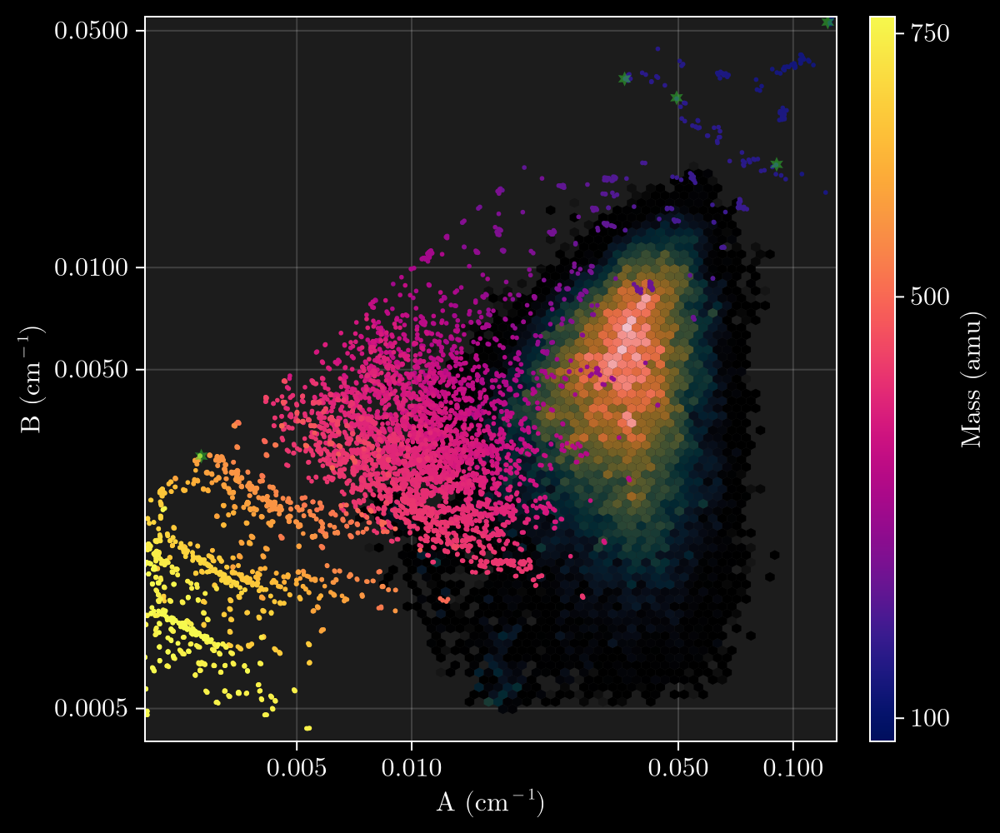

In [33]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [5e-3,1e-2,5e-2,1e-1],
    yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"A (cm$^{-1}$)",
    ylabel=L"B (cm$^{-1}$)",
    backgroundcolor = :grey11,
)

xlims!(ax,2e-3,1.3e-1)
ylims!(ax,4e-4,5.5e-2)

co = hexbin!(ax,A,B,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk],ABCmat[2,.!msk],color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

scatter!(ax,ABCmat[1,msk],ABCmat[2,msk],color=("limegreen",0.5), marker=:star6, markersize=10)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

In [221]:
extrema(ABCmat[1,msk]), extrema(ABCmat[2,msk])

((0.0028095355340435955, 0.12321346614149077), (0.0027772019380065557, 0.05300482017886117))

In [226]:
ABCmat[1,msk]

5-element Vector{Float64}:
 0.12321346614149077
 0.049472338709246555
 0.09049933537236979
 0.0361540125721313
 0.0028095355340435955

In [229]:
ABCmat[3,msk]

5-element Vector{Float64}:
 0.03731425950174018
 0.01932053570808746
 0.01648693726256914
 0.018110015569940238
 0.00277716809936975

# Working in MHz

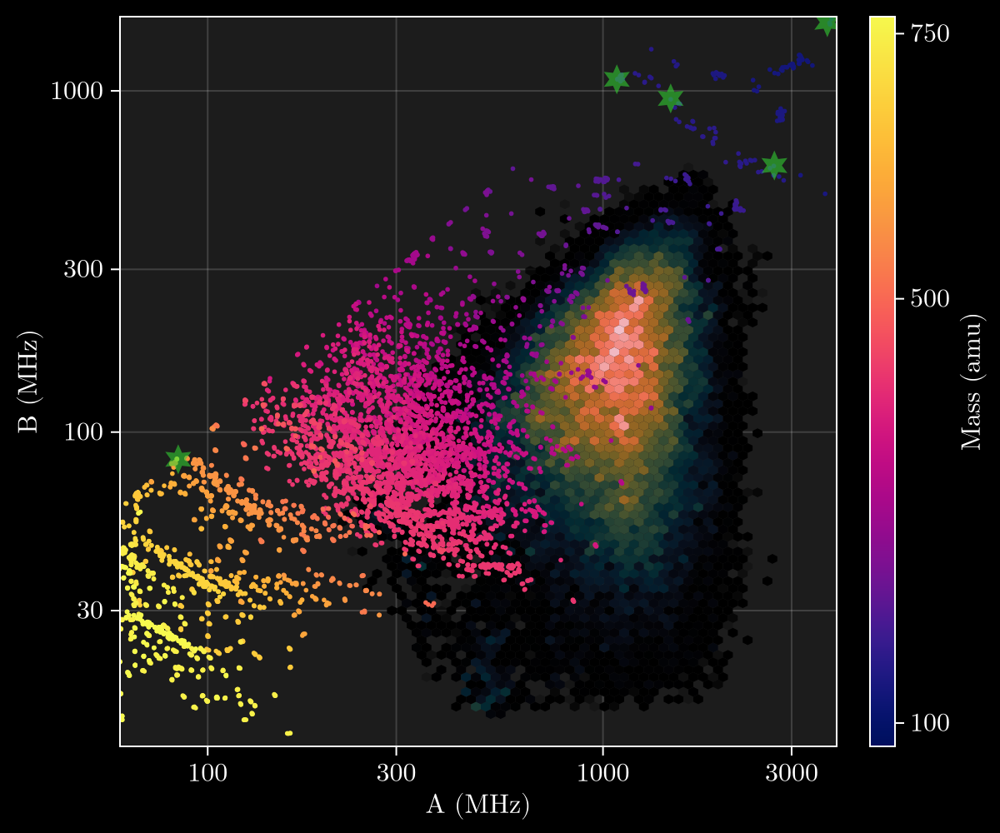

In [34]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

scatter!(ax,ABCmat[1,msk]*cm2MHz,ABCmat[2,msk]*cm2MHz,color=("limegreen",0.6), marker=:star6, markersize=20)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[100,500,750])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

In [35]:
radio_const = Dict{String,Vector{Float64}}()
# https://ui.adsabs.harvard.edu/abs/2025A%26A...701L...8C/abstract
radio_const["phenalene"] = [1108.124, 1067.811, 545.856]
# https://ui.adsabs.harvard.edu/abs/2025ApJ...984L..36W/abstract
radio_const["cyanocoronene"] = [333.853, 221.2701, 133.1081]
# https://ui.adsabs.harvard.edu/abs/2021ApJ...913L..18B/abstract
radio_const["indene"] = [3775.038, 1580.8641, 1122.2484]
# https://ui.adsabs.harvard.edu/abs/2022ApJ...938L..12S/abstract
radio_const["2-cyanoindene"] = [3754.4, 675.991, 574.982]
# https://ui.adsabs.harvard.edu/abs/2021Sci...371.1265M/abstract
# https://ui.adsabs.harvard.edu/abs/2018MNRAS.476.5268M/abstract
radio_const["1-cyanonaphthalene"] = [1478.8483, 956.7842, 580.98898]
radio_const["2-cyanonaphthalene"] = [2707.0099, 606.0955, 495.2935]
# https://ui.adsabs.harvard.edu/abs/2024A%26A...690L..13C/abstract
radio_const["1-cyanoacenaphthylene"] = [1272.17, 647.279, 429.061]
radio_const["5-cyanoacenaphthylene"] = [1246.58, 690.18, 444.298]
# https://ui.adsabs.harvard.edu/abs/2024Sci...386..810W/abstract
# https://ui.adsabs.harvard.edu/abs/2025NatAs...9..262W/abstract
radio_const["1-cyanopyrene"] = [843.140, 372.5002, 258.4249]
radio_const["2-cyanopyrene"] = [1009.194, 313.1345, 239.0427]
radio_const["5-cyanopyrene"] = [651.3830, 453.7313, 267.5078];
# https://ui.adsabs.harvard.edu/abs/2018ApJS..239...17M/abstract
# useful, but all other molecules are too small and less relevant

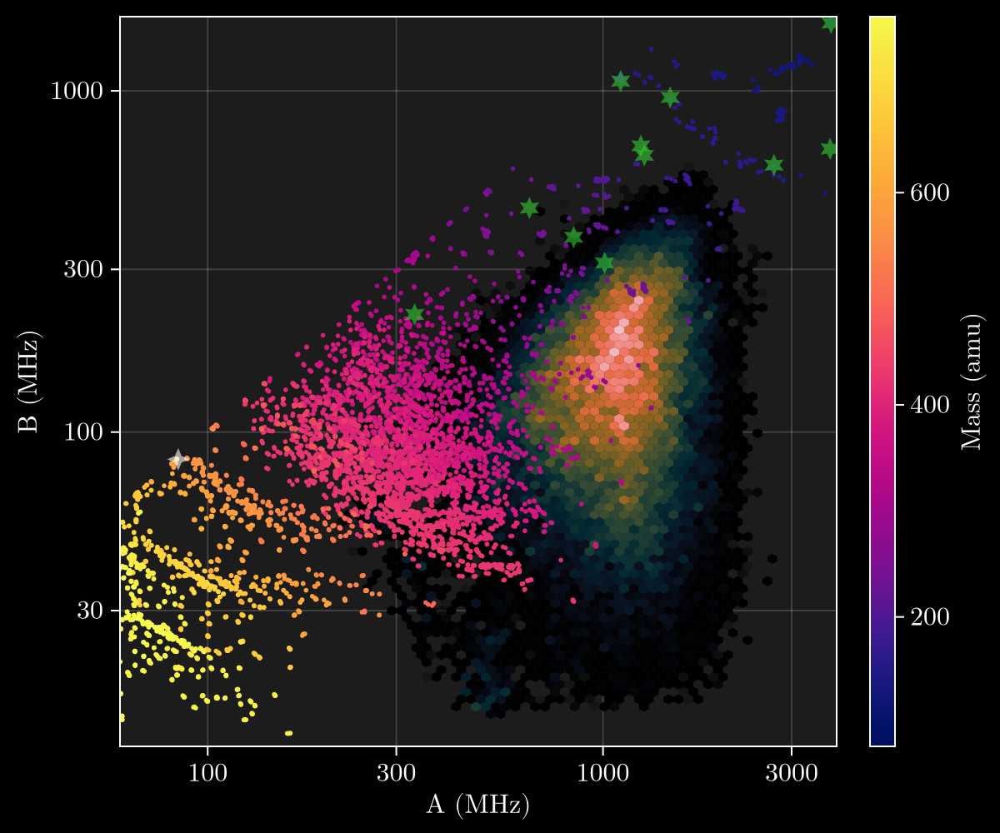

In [40]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

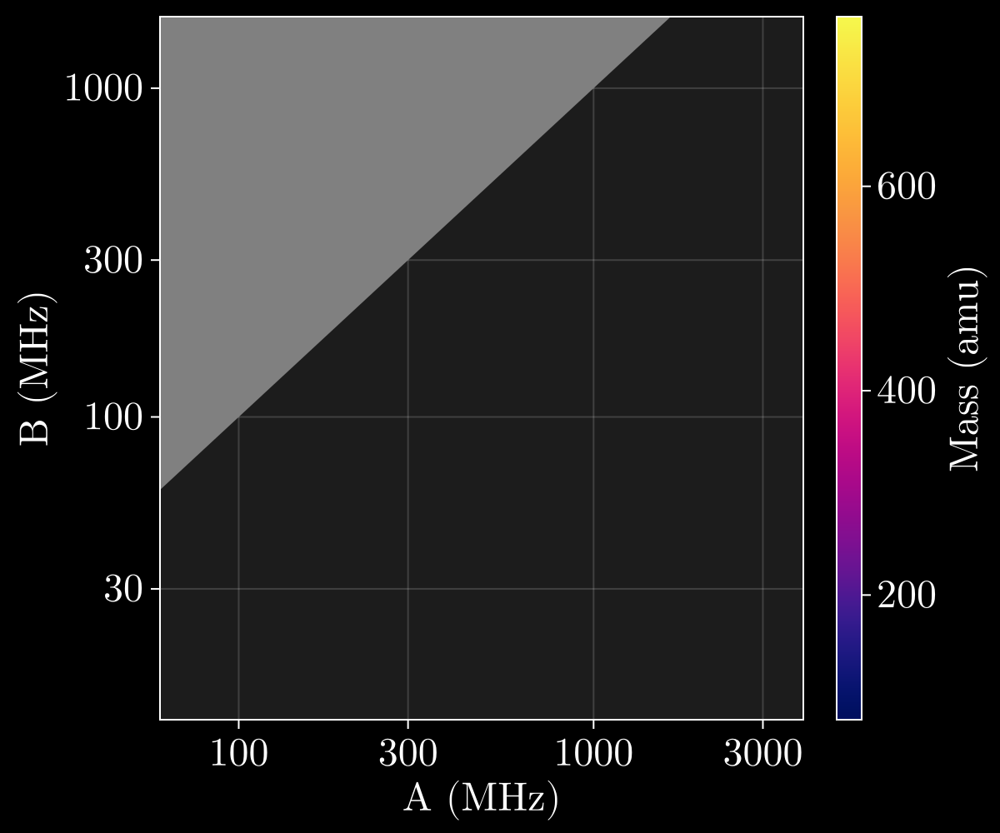

In [52]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

# co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
#     cellsize = 0.025,
#     threshold = 0.0,
#     colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
#     # colorrange = (0,100),
# )

# co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
#     colorrange=(78,766),
#     colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

# for key in keys(radio_const)
#     scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
# end
# tindx = findall(map(x->x.uid, entries) .== 720) # C60+
# scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

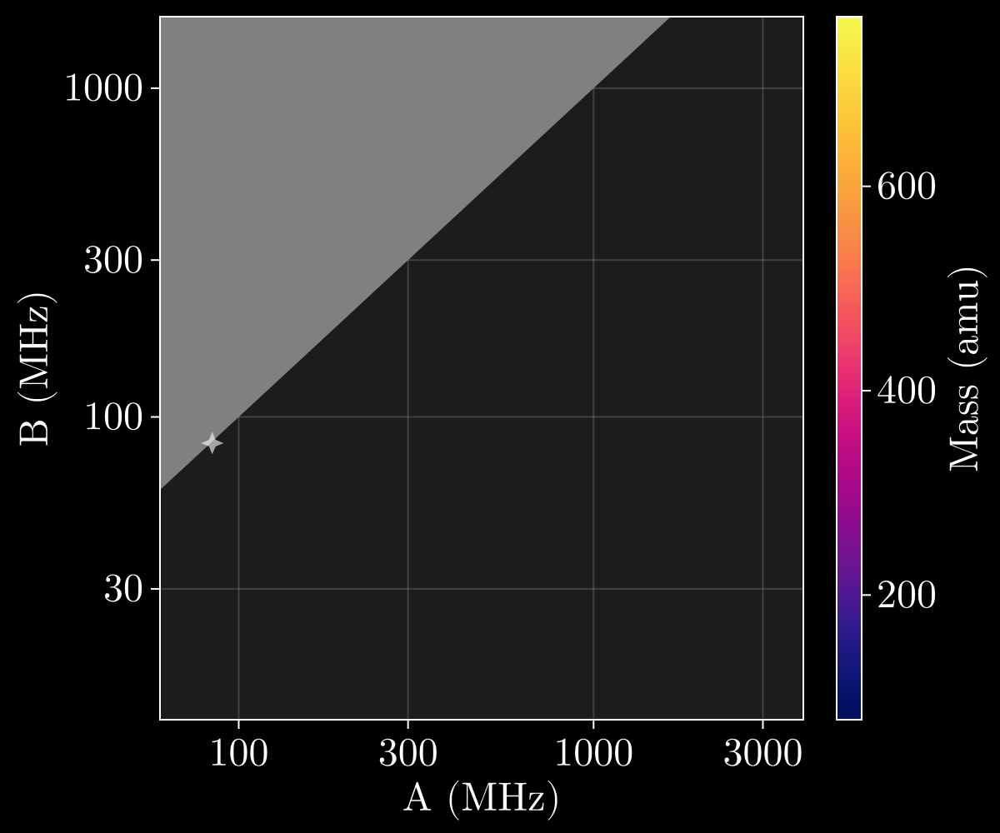

In [53]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

# co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
#     cellsize = 0.025,
#     threshold = 0.0,
#     colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
#     # colorrange = (0,100),
# )

# co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
#     colorrange=(78,766),
#     colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

# for key in keys(radio_const)
#     scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
# end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

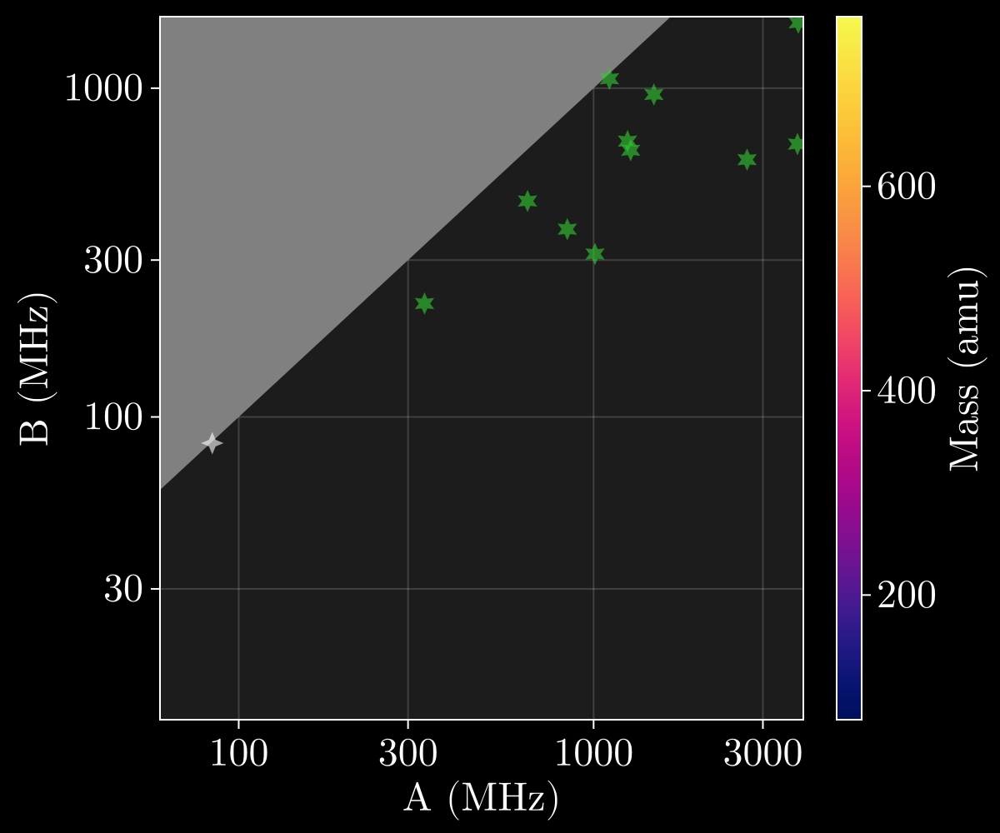

In [54]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

# co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
#     cellsize = 0.025,
#     threshold = 0.0,
#     colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
#     # colorrange = (0,100),
# )

# co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
#     colorrange=(78,766),
#     colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

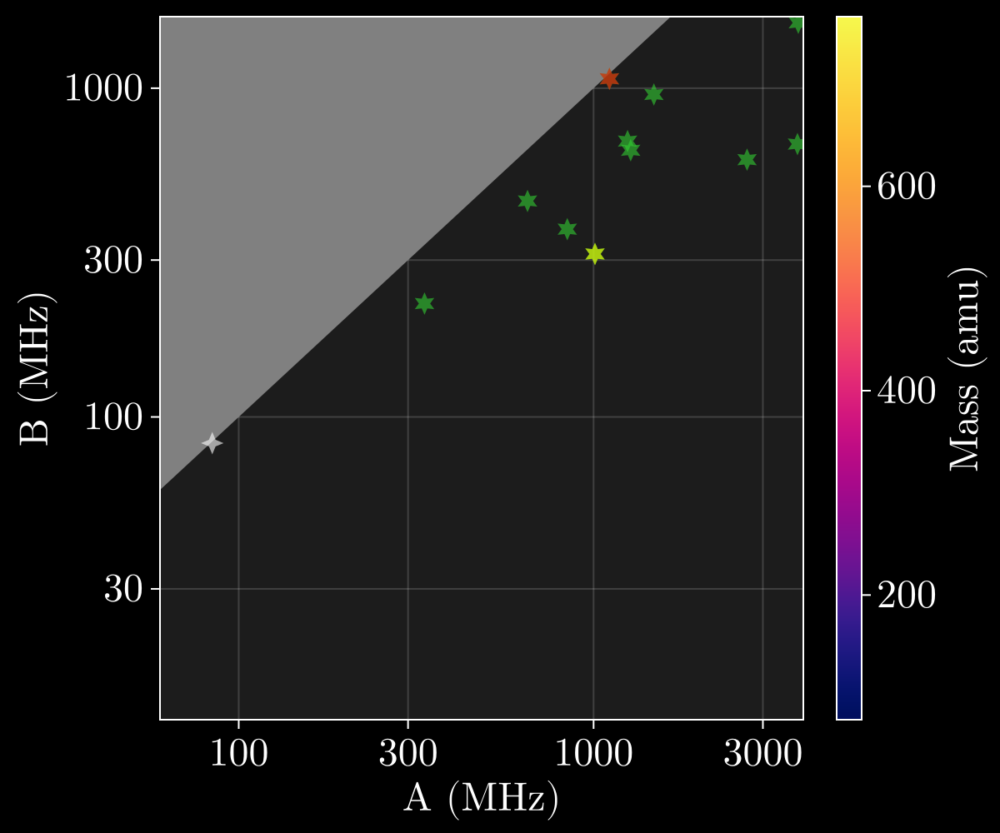

In [59]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

# co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
#     cellsize = 0.025,
#     threshold = 0.0,
#     colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
#     # colorrange = (0,100),
# )

# co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
#     colorrange=(78,766),
#     colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)
key = "phenalene"
scatter!(ax,radio_const[key][1],radio_const[key][2],color=("red",0.6), marker=:star6, markersize=15)
key = "2-cyanopyrene"
scatter!(ax,radio_const[key][1],radio_const[key][2],color=("yellow",0.6), marker=:star6, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

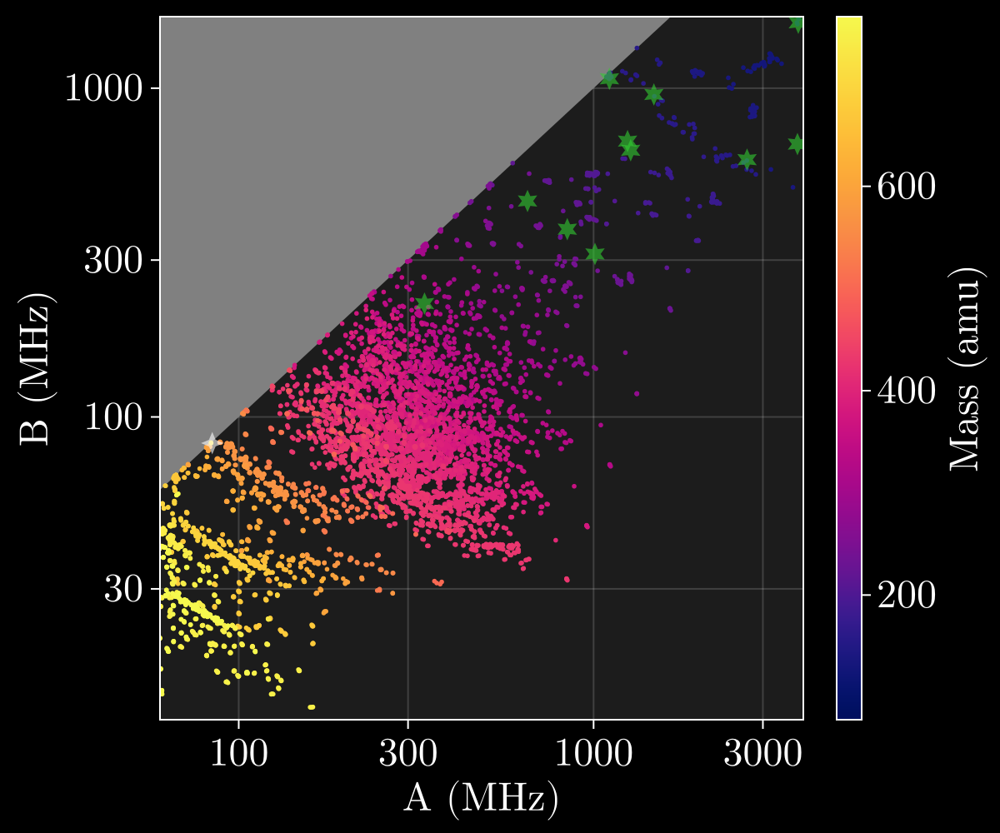

In [60]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

# co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
#     cellsize = 0.025,
#     threshold = 0.0,
#     colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
#     # colorrange = (0,100),
# )

co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

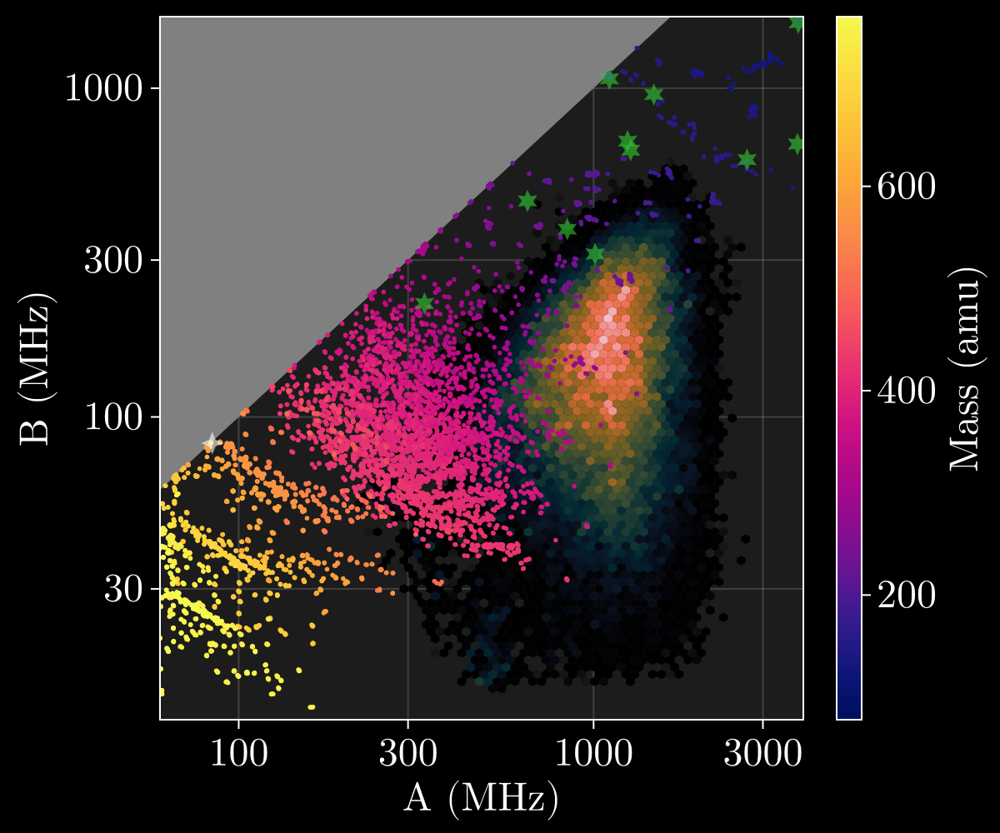

In [61]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

In [55]:
radio_const

Dict{String, Vector{Float64}} with 11 entries:
  "5-cyanoacenaphthylene" => [1246.58, 690.18, 444.298]
  "2-cyanopyrene"         => [1009.19, 313.135, 239.043]
  "5-cyanopyrene"         => [651.383, 453.731, 267.508]
  "cyanocoronene"         => [333.853, 221.27, 133.108]
  "phenalene"             => [1108.12, 1067.81, 545.856]
  "2-cyanonaphthalene"    => [2707.01, 606.096, 495.293]
  "1-cyanonaphthalene"    => [1478.85, 956.784, 580.989]
  "1-cyanopyrene"         => [843.14, 372.5, 258.425]
  "2-cyanoindene"         => [3754.4, 675.991, 574.982]
  "1-cyanoacenaphthylene" => [1272.17, 647.279, 429.061]
  "indene"                => [3775.04, 1580.86, 1122.25]

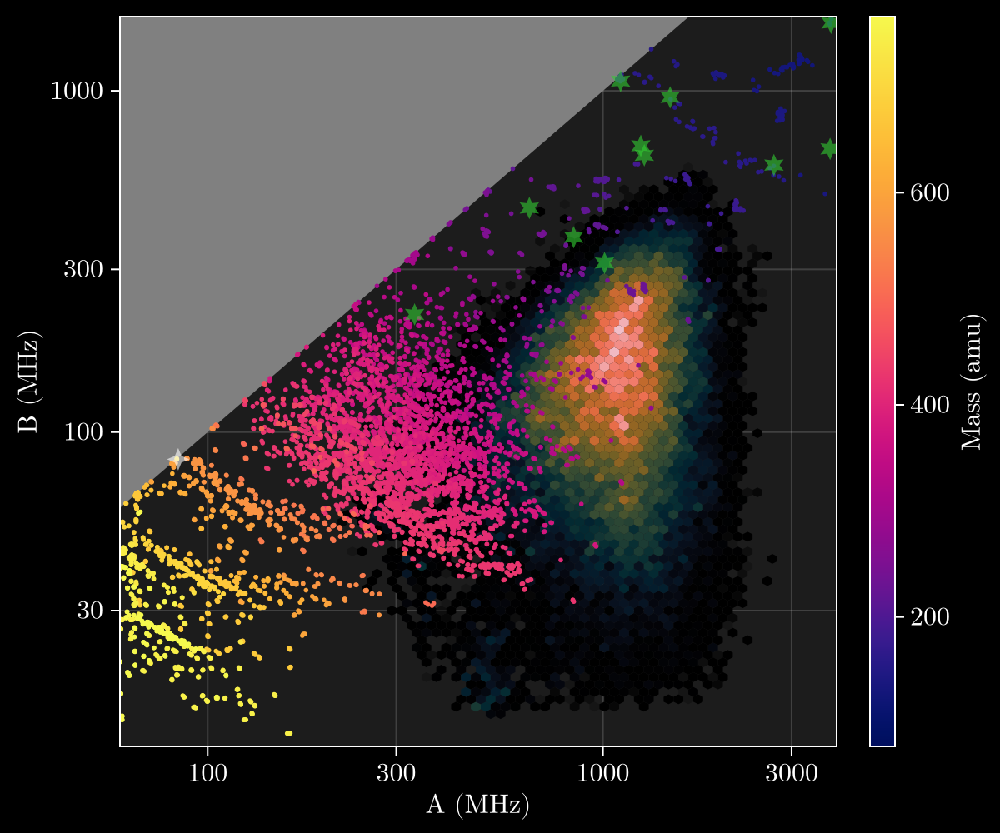

In [47]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

# Shade region where B > A
x_band = [60, 1650, 3900]
y_lower = [60, 1650, 1650]  # The B=A diagonal line extended
y_upper = [1650, 1650, 1650]  # The top of the plot
band!(ax, x_band, y_lower, y_upper, color=(:grey, 1))

co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk]*cm2MHz,ABCmat[2,.!msk]*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,ABCmat[2,tindx]*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

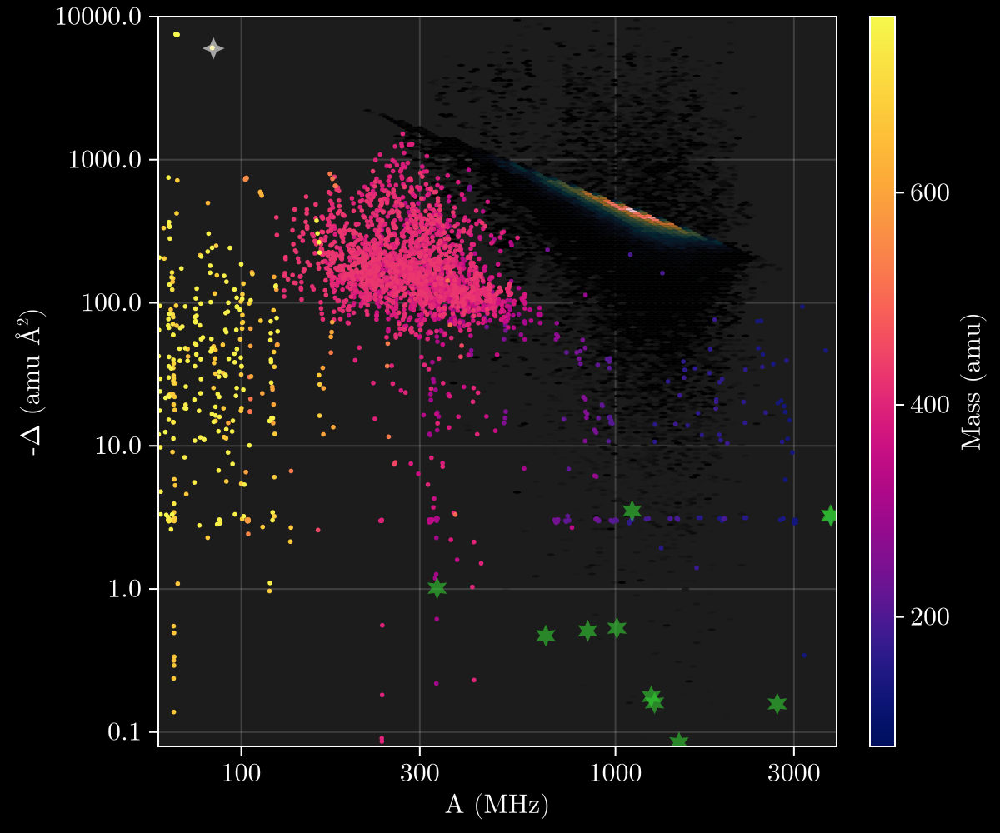

In [36]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))

ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [0.1, 1, 10, 100, 1000, 10_000],
    xlabel="A (MHz)",
    ylabel=L"-Δ (amu Å$^2$)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,10^(-1.1),10^(4))

co = hexbin!(ax,A.*cm2MHz,abs.(-Δ_post),
    cellsize = (0.02,0.02),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk].*cm2MHz,abs.(-Δ[.!msk]),color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],abs.(-get_delta(radio_const[key][1]/cm2MHz,radio_const[key][2]/cm2MHz,radio_const[key][3]/cm2MHz)),color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx]*cm2MHz,abs.(-get_delta.(ABCmat[1,tindx],ABCmat[2,tindx],ABCmat[3,tindx])),color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

choose to cut off one prolate radio PAH

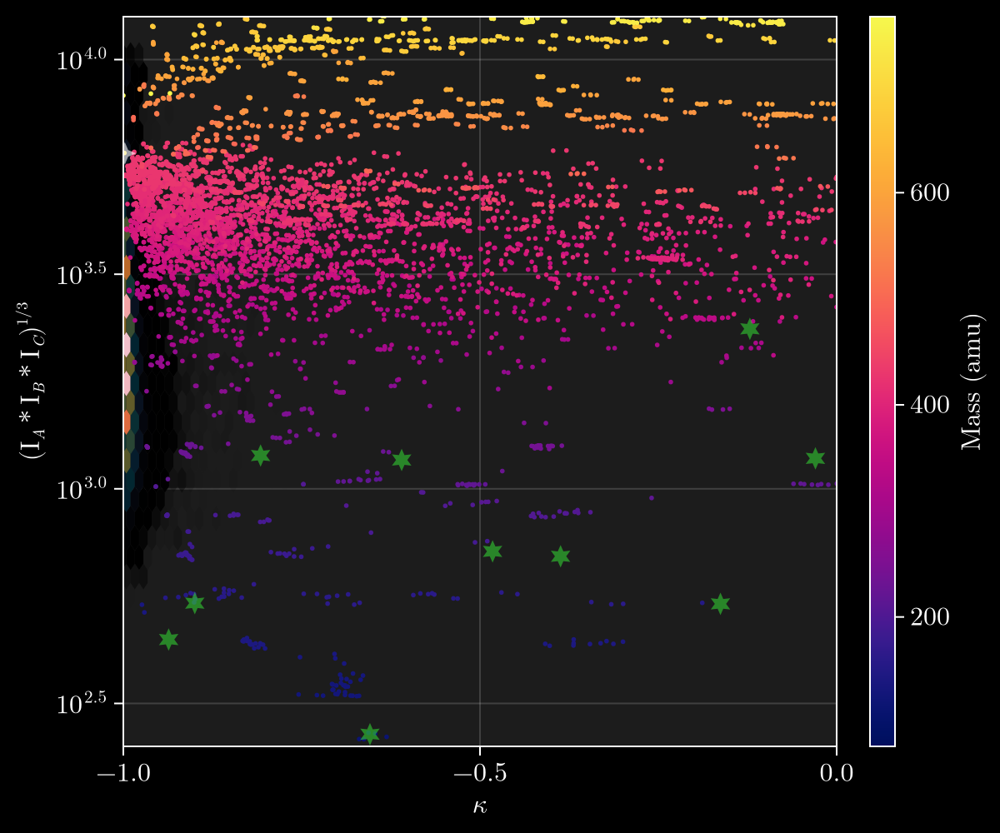

In [355]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
ax = Axis(fig[1, 1],
    # xscale=Makie.pseudolog10,
    yscale=log10,
    # xticks = [5e-4,5e-3],
    # yticks = [5e-4,1e-4,5e-3,1e-2,5e-2],
    xlabel=L"$\kappa$",
    ylabel=L"(I$_A$*I$_B$*I$_C$)$^{1/3}$",
    backgroundcolor = :grey11,
)

xlims!(ax,-1,0)
ylims!(ax,10^(2.4),10^(4.1))

co = hexbin!(ax,kap_vec_post,Iprod_post.^(1/3),
    cellsize = (0.012,0.06),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,kap_vec[.!msk],Iprod[.!msk].^(1/3),color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)
for key in keys(radio_const)
    scatter!(ax,rasym_param(radio_const[key][1]/cm2MHz,radio_const[key][2]/cm2MHz,radio_const[key][3]/cm2MHz),get_iprod(radio_const[key][1]/cm2MHz,radio_const[key][2]/cm2MHz,radio_const[key][3]/cm2MHz).^(1/3),color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,rasym_param.(ABCmat[1,tindx],ABCmat[2,tindx],ABCmat[3,tindx]),get_iprod.(ABCmat[1,tindx],ABCmat[2,tindx],ABCmat[3,tindx]).^(1/3),color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

In [66]:
maximum( (ABCmat[2,.!msk].-ABCmat[3,.!msk])./ABCmat[2,.!msk])

0.49999999920986865

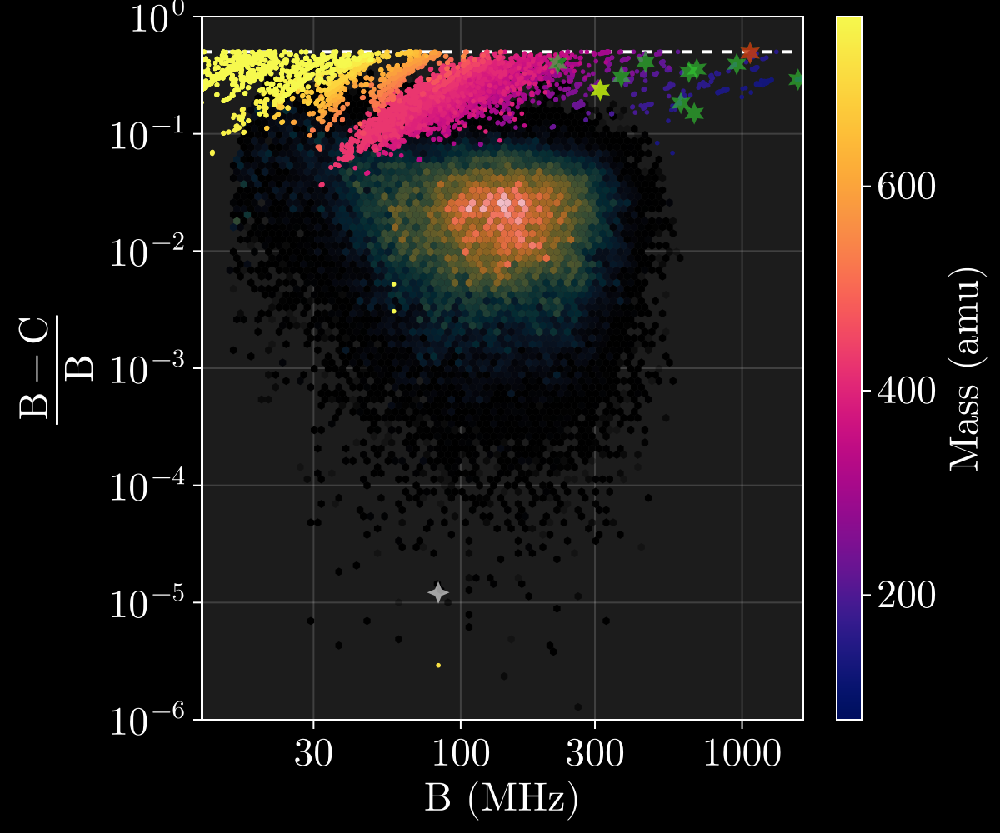

In [73]:
fig = Figure(size=(600, 500), fontsize=24,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [30, 100, 300, 1000],
    # yticks = [1e-5,5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel="B (MHz)",
    ylabel=L"\frac{\text{B-C}}{\text{B}}",
    backgroundcolor = :grey11,
)

xlims!(ax,12,1650)
ylims!(ax,1e-6,1e0)
hlines!(ax, 0.5, color=:white, linewidth=2, linestyle=:dash)

co = hexbin!(ax,B.*cm2MHz, (B.-C)./B,
    cellsize = (0.025,0.07),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[2,.!msk].*cm2MHz, (ABCmat[2,.!msk].-ABCmat[3,.!msk])./ABCmat[2,.!msk],color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][2],(radio_const[key][2].-radio_const[key][3])./radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[2,tindx].*cm2MHz,(ABCmat[2,tindx].-ABCmat[3,tindx])./ABCmat[2,tindx],color=("white",0.6), marker=:star4, markersize=15)

key = "phenalene"
scatter!(ax,radio_const[key][2],(radio_const[key][2].-radio_const[key][3])./radio_const[key][2],color=("red",0.6), marker=:star6, markersize=15)
key = "2-cyanopyrene"
scatter!(ax,radio_const[key][2],(radio_const[key][2].-radio_const[key][3])./radio_const[key][2],color=("yellow",0.6), marker=:star6, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

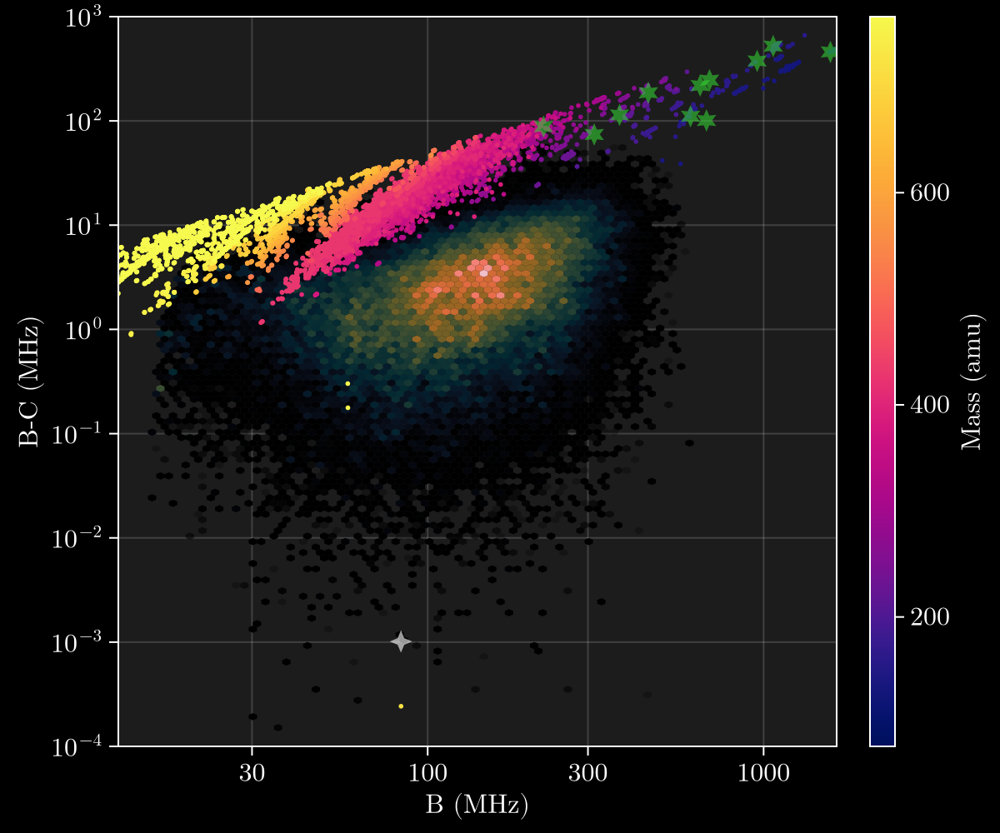

In [357]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [30, 100, 300, 1000],
    # yticks = [1e-5,5e-4,1e-4,2e-3,1e-2,5e-2],
    xlabel="B (MHz)",
    ylabel="B-C (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,12,1650)
ylims!(ax,1e-4,1e3)

co = hexbin!(ax,B.*cm2MHz, (B.-C).*cm2MHz,
    cellsize = (0.025,0.07),
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[2,.!msk].*cm2MHz, (ABCmat[2,.!msk].-ABCmat[3,.!msk]).*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][2],(radio_const[key][2].-radio_const[key][3]),color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[2,tindx].*cm2MHz,(ABCmat[2,tindx].-ABCmat[3,tindx]).*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

Colorbar(fig[1, 2], co, width = 15, height = Relative(1), label="Mass (amu)", ticks=[200,400,600])

colgap!(fig.layout, 1, 20)

resize_to_layout!(fig)
fig

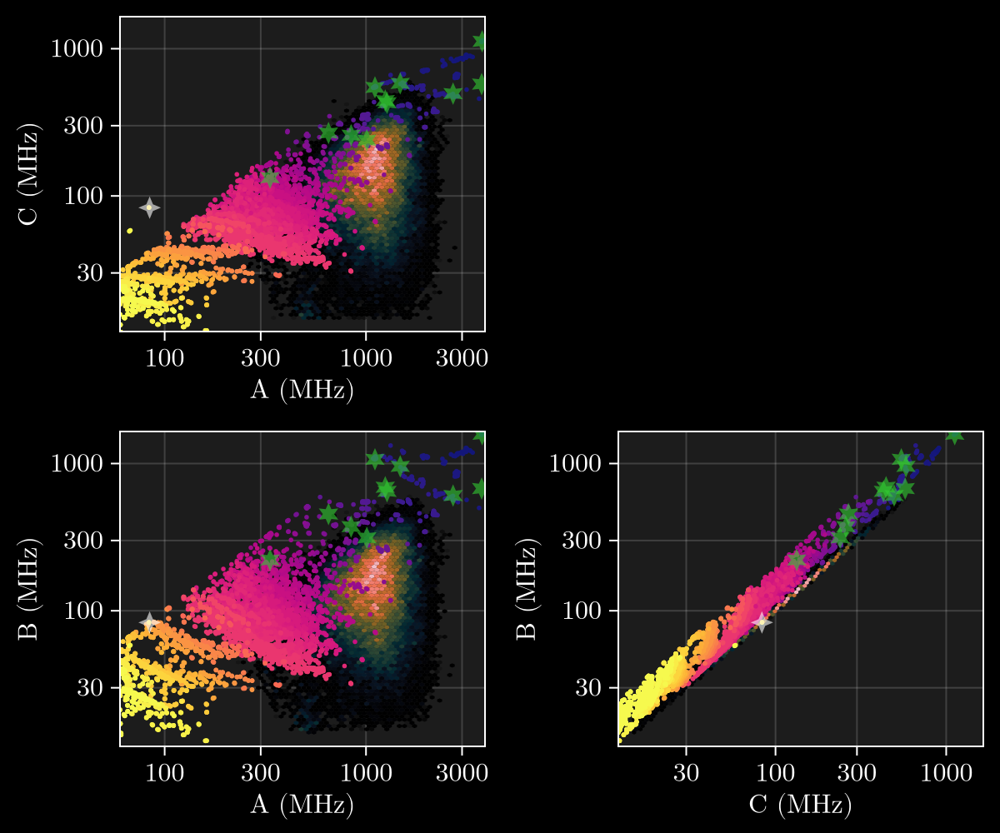

In [ ]:
fig = Figure(size=(600, 500), fontsize=16,
    figure_padding=(10,10,10,10))
    
ax = Axis(fig[2, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

co = hexbin!(ax,A.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk].*cm2MHz,ABCmat[2,.!msk].*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx].*cm2MHz,ABCmat[2,tindx].*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

ax = Axis(fig[1, 1],
    xscale=log10,
    yscale=log10,
    xticks = [100, 300, 1000, 3000],
    yticks = [30, 100, 300, 1000],
    xlabel="A (MHz)",
    ylabel="C (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,60,3900)
ylims!(ax,12,1650)

co = hexbin!(ax,A.*cm2MHz,C.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[1,.!msk].*cm2MHz,ABCmat[3,.!msk].*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][1],radio_const[key][3],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[1,tindx].*cm2MHz,ABCmat[3,tindx].*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

ax = Axis(fig[2, 2],
    xscale=log10,
    yscale=log10,
    xticks = [30, 100, 300, 1000],
    yticks = [30, 100, 300, 1000],
    xlabel="C (MHz)",
    ylabel="B (MHz)",
    backgroundcolor = :grey11,
)

xlims!(ax,12,1650)
ylims!(ax,12,1650)

co = hexbin!(ax,C.*cm2MHz,B.*cm2MHz,
    cellsize = 0.025,
    threshold = 0.0,
    colormap = [Makie.to_color(:transparent); Makie.to_colormap(ColorSchemes.cmr_dusk)],
    # colorrange = (0,100),
)

co = scatter!(ax,ABCmat[3,.!msk].*cm2MHz,ABCmat[2,.!msk].*cm2MHz,color=Mmat[.!msk],
    colorrange=(78,766),
    colormap=ColorSchemes.linear_bmy_10_95_c71_n256, markersize=4)

for key in keys(radio_const)
    scatter!(ax,radio_const[key][3],radio_const[key][2],color=("limegreen",0.6), marker=:star6, markersize=15)
end
tindx = findall(map(x->x.uid, entries) .== 720) # C60+
scatter!(ax,ABCmat[3,tindx].*cm2MHz,ABCmat[2,tindx].*cm2MHz,color=("white",0.6), marker=:star4, markersize=15)

resize_to_layout!(fig)
fig

# spAll Quick Check

In [10]:
using FITSIO, FreqTables

In [6]:
f = FITS("/uufs/chpc.utah.edu/common/home/sdss52/ipl-4/spectro/boss/redux/v6_2_1/summary/allepoch/spAll-lite-v6_2_1-allepoch.fits.gz")

File: /uufs/chpc.utah.edu/common/home/sdss52/ipl-4/spectro/boss/redux/v6_2_1/summary/allepoch/spAll-lite-v6_2_1-allepoch.fits.gz
Mode: "r" (read-only)
HDUs: Num  Name   Type   
      1           Image  
      2    SPALL  Table  

In [8]:
OBJTYPE = read(f[2],"OBJTYPE")

506550-element Vector{String}:
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 "QSO"
 ⋮
 "science"
 "science"
 "QSO"
 "QSO"
 "science"
 "science"
 "science"
 "science"
 "QSO"
 "QSO"
 "science"
 "science"

In [9]:
close(f)

In [11]:
sort(freqtable(OBJTYPE))

3-element Named Vector{Int64}
Dim1             │ 
─────────────────┼───────
SPECTROPHOTO_STD │    337
QSO              │  25526
science          │ 480687

In [17]:
5_015_597/41_253

121.5813880202652

In [16]:
130_577_797/41_253

3165.2921484498097